<a href="https://colab.research.google.com/github/MauricioViera95/Sensores_Remotos/blob/main/Caso_practico_Sentinel2_El_Altar_parte_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sensores Remotos
## Caso de estudio: El Altar - Riobamba - Ecuador
## Mauricio Viera-Torres

### Contenido:
- Lectura de datos vector y raster
- Modificación de umbrales para visualización de combinación de bandas
- Estadísticas zonales
- Clasificación supervisada - KNN

En este caso de estudio se procederá a analizar la zona del glaciar de El Altar.

In [ ]:
# Librerías a utilizar
from osgeo import gdal, osr
import numpy as np
import matplotlib.pyplot as plt
from termcolor import colored

import rasterio
import numpy as np
from fiona import crs as CRS
from matplotlib import pyplot as plt
from rasterio.mask import mask
from rasterio.plot import plotting_extent
from shapely.geometry import box
import geopandas as gpd

Para ello se propone utilizar una imagen Sentinel 2A.

In [ ]:
# Abrir la imagen del caso de estudio
ruta_imagen = '../data/raw_data/Sentinel2_Altar.tif'
ds = gdal.Open(ruta_imagen)

Luego se procede a analizar la información básica que ofrece la imagen.

In [ ]:
# Verificar información básica de la imagen
print(ds)
print(colored('Archivos asociados:', 'blue'), ds.GetFileList())
print(colored('Descripción de la imagen:', 'blue'), ds.GetDescription())

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x000002193239AB70> >
Archivos asociados: ['../data/raw_data/Sentinel2_Altar.tif', '../data/raw_data/Sentinel2_Altar.tif.aux.xml']
Descripción de la imagen: ../data/raw_data/Sentinel2_Altar.tif


In [ ]:
# Verificar información básica de la imagen
print(colored('Número de bandas:', 'blue'), ds.RasterCount)
print(colored('Número de columnas (X):', 'blue'), ds.RasterXSize)
print(colored('Número de filas (Y):', 'blue'), ds.RasterYSize)

Número de bandas: 4
Número de columnas (X): 2833
Número de filas (Y): 2435


In [ ]:
# Información sobre el formato
print(colored('Nombre largo del formato:', 'blue'), ds.GetDriver().LongName)
print(colored('Abreviación del formato:', 'blue'), ds.GetDriver().ShortName)

Nombre largo del formato: GeoTIFF
Abreviación del formato: GTiff


In [ ]:
# Información sobre la proyección
print(colored('Proyección:', 'blue'), ds.GetProjection())
proj = osr.SpatialReference(wkt=ds.GetProjection())
print(colored('Código EPSG:', 'blue'), proj.GetAttrValue("AUTHORITY", 1))

Proyección: PROJCS["WGS 84 / UTM zone 17S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32717"]]
Código EPSG: 32717


Banda 1: Min = 1142, Max = 11941
Banda 2: Min = 1017, Max = 11704
Banda 3: Min = 1244, Max = 11896
Banda 4: Min = 1118, Max = 10840


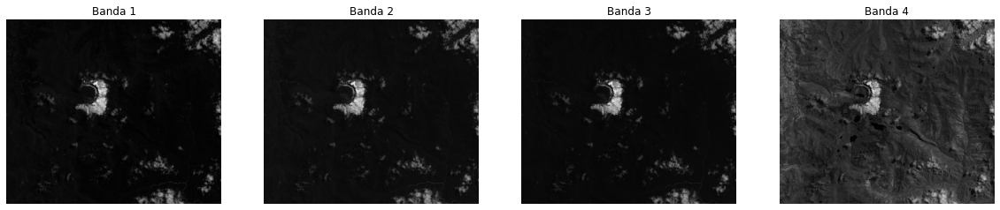

In [ ]:
# Leer y visualizar las bandas
fig, ax = plt.subplots(1, ds.RasterCount, figsize=(20, 5))

for i in range(1, ds.RasterCount + 1):
    banda = ds.GetRasterBand(i)
    array_banda = banda.ReadAsArray()  # Cargar la banda como array NumPy

    # Mostrar información de la banda
    print(f"Banda {i}: Min = {np.min(array_banda)}, Max = {np.max(array_banda)}")

    # Visualizar la banda
    ax[i - 1].imshow(array_banda, cmap='gray')
    ax[i - 1].set_title(f'Banda {i}')
    ax[i - 1].axis('off')

plt.show()

In [ ]:
# Imprimir la información del dataset, incluyendo el nombre de las bandas
print(gdal.Info(ds))

Driver: GTiff/GeoTIFF
Files: ../data/raw_data/Sentinel2_Altar.tif
       ../data/raw_data/Sentinel2_Altar.tif.aux.xml
Size is 2833, 2435
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 17S",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 17S",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-81,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",500000,
   

In [ ]:
# Leer las bandas usando el orden verificado
banda_roja = ds.GetRasterBand(1).ReadAsArray()  # B4 (Rojo)
banda_verde = ds.GetRasterBand(2).ReadAsArray()  # B3 (Verde)
banda_azul = ds.GetRasterBand(3).ReadAsArray()  # B2 (Azul)
banda_nir = ds.GetRasterBand(4).ReadAsArray()   # B8 (NIR)

print(f"Dimensiones de la banda roja: {banda_roja.shape}")
print(f"Dimensiones de la banda NIR: {banda_nir.shape}")

Dimensiones de la banda roja: (2435, 2833)
Dimensiones de la banda NIR: (2435, 2833)


Se analiza los valores mínimos de las bandas, en este caso se muestra a la banda B4, con la finalidad de establecer valores que permitan mejorar la visualización de la imagen a través de la manipulación del histograma.

In [ ]:
# Estadísticas básicas de la banda roja
print(colored('Valor mínimo (B4):', 'blue'), np.nanmin(banda_roja))
print(colored('Valor máximo (B4):', 'blue'), np.nanmax(banda_roja))

Valor mínimo (B4): 1142
Valor máximo (B4): 11941


In [ ]:
#Definiendo umbrales personalizados:
vmin = 1200
vmax = 11800

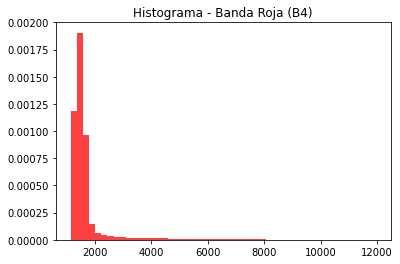

In [ ]:
# Histograma de la banda roja
plt.hist(banda_roja.ravel(), bins=50, density=True, color='r', alpha=0.75)
plt.title('Histograma - Banda Roja (B4)')
plt.show()

In [ ]:
# Calcular percentiles y umbrales personalizados para B4
vminP, vmaxP = np.percentile(banda_roja, [1, 99])
print(colored('Percentil 1% (B4):', 'blue'), vminP)
print(colored('Percentil 99% (B4):', 'blue'), vmaxP)

Percentil 1% (B4): 1237.0
Percentil 99% (B4): 6818.0


In [ ]:
# Umbral basado en media y desviación estándar
vmean = np.nanmean(banda_roja)
std = np.std(banda_roja)
vminSTD = vmean - 2 * std
vmaxSTD = vmean + 2 * std

print(colored('Umbral STD Mínimo (B4):', 'blue'), vminSTD)
print(colored('Umbral STD Máximo (B4):', 'blue'), vmaxSTD)

Umbral STD Mínimo (B4): -218.84223750990964
Umbral STD Máximo (B4): 3640.2883637240575


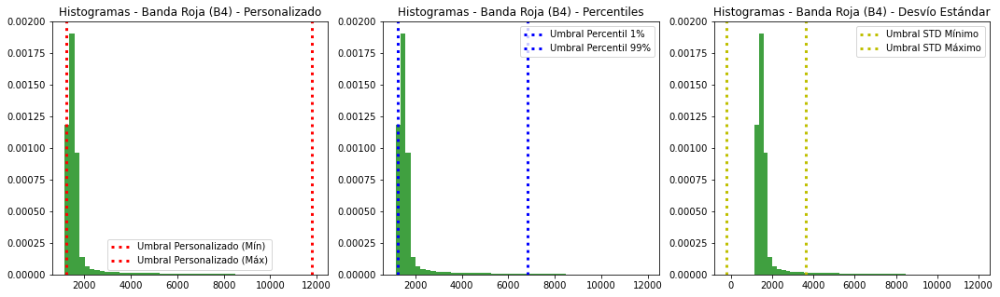

In [ ]:
# Graficar los histogramas
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

# Histograma para el umbral personalizado
ax[0].hist(banda_roja.ravel(), 50, density=True, facecolor='g', alpha=0.75)
ax[0].axvline(x=vmin, color='r', linestyle=':', linewidth=3, label='Umbral Personalizado (Mín)')
ax[0].axvline(x=vmax, color='r', linestyle=':', linewidth=3, label='Umbral Personalizado (Máx)')
ax[0].set_title('Histogramas - Banda Roja (B4) - Personalizado')
ax[0].legend()

# Histograma para percentiles
ax[1].hist(banda_roja.ravel(), 50, density=True, facecolor='g', alpha=0.75)
ax[1].axvline(x=vminP, color='b', linestyle=':', linewidth=3, label='Umbral Percentil 1%')
ax[1].axvline(x=vmaxP, color='b', linestyle=':', linewidth=3, label='Umbral Percentil 99%')
ax[1].set_title('Histogramas - Banda Roja (B4) - Percentiles')
ax[1].legend()

# Histograma para desvío estándar
ax[2].hist(banda_roja.ravel(), 50, density=True, facecolor='g', alpha=0.75)
ax[2].axvline(x=vminSTD, color='y', linestyle=':', linewidth=3, label='Umbral STD Mínimo')
ax[2].axvline(x=vmaxSTD, color='y', linestyle=':', linewidth=3, label='Umbral STD Máximo')
ax[2].set_title('Histogramas - Banda Roja (B4) - Desvío Estándar')
ax[2].legend()

plt.show()

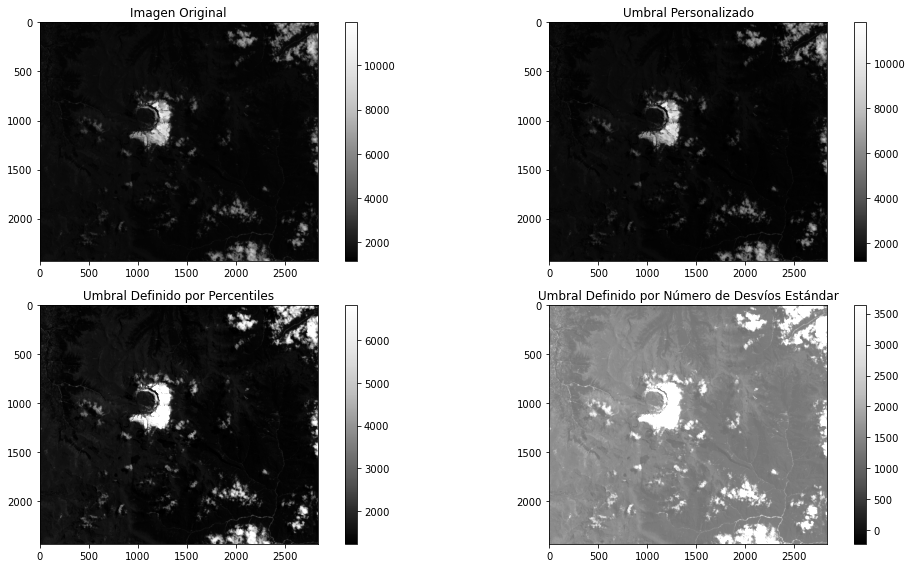

In [ ]:
# Graficar las imágenes
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))

# Mostrar imágenes
im1 = ax[0][0].imshow(banda_roja, cmap='Greys_r')
im2 = ax[0][1].imshow(banda_roja, vmin=vmin, vmax=vmax, cmap='Greys_r')
im3 = ax[1][0].imshow(banda_roja, vmin=vminP, vmax=vmaxP, cmap='Greys_r')
im4 = ax[1][1].imshow(banda_roja, vmin=vminSTD, vmax=vmaxSTD, cmap='Greys_r')

# Títulos
ax[0][0].set_title('Imagen Original')
ax[0][1].set_title('Umbral Personalizado')
ax[1][0].set_title('Umbral Definido por Percentiles')
ax[1][1].set_title('Umbral Definido por Número de Desvíos Estándar')

# Colorbar para cada imagen
plt.colorbar(im1, ax=ax[0, 0])
plt.colorbar(im2, ax=ax[0, 1])
plt.colorbar(im3, ax=ax[1, 0])
plt.colorbar(im4, ax=ax[1, 1])

plt.tight_layout()
plt.show()

Se define una función que permita escalar un array y permita mejorar la visualización de la imagen, en base a valores máximos y mínimos y percentiles.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def scale(array, p=0):
    '''
    Escala un array 2D a valores entre 0 y 1, tomando como mínimo el percentil p
    y como máximo el percentil 100-p. Además, visualiza el array original y el escalado.

    Parameters:
    array (ndarray): Array 2D a escalar.
    p (float): Percentil para determinar los límites de escalado. Por defecto es 0.

    Returns:
    ndarray: Array escalado entre 0 y 1.
    '''

    # Extraer los valores válidos del array
    valid_values = array[array != np.nan]

    # Calcular vmin y vmax basados en los percentiles
    vmin = np.percentile(valid_values, p)  # Percentil p
    vmax = np.percentile(valid_values, 100 - p)  # Percentil 100-p

    # Escalar los valores
    # Usar np.clip para limitar valores por debajo de vmin y por encima de vmax
    scaled = (np.clip(array, vmin, vmax) - vmin) / (vmax - vmin)

    # Asegurarse de que los valores por debajo de vmin se conviertan en 0
    # y los valores por encima de vmax se conviertan en 1
    scaled[array < vmin] = 0
    scaled[array > vmax] = 1

    # Visualización del array original y escalado
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax[0].imshow(array, cmap='Greys_r', vmin=np.nanmin(array), vmax=np.nanmax(array))
    ax[0].set_title('Array Original')
    plt.colorbar(ax[0].imshow(array, cmap='Greys_r'), ax=ax[0])

    ax[1].imshow(scaled, cmap='Greys_r', vmin=0, vmax=1)
    ax[1].set_title('Array Escalado')
    plt.colorbar(ax[1].imshow(scaled, cmap='Greys_r'), ax=ax[1])

    plt.tight_layout()
    plt.show()

    return scaled

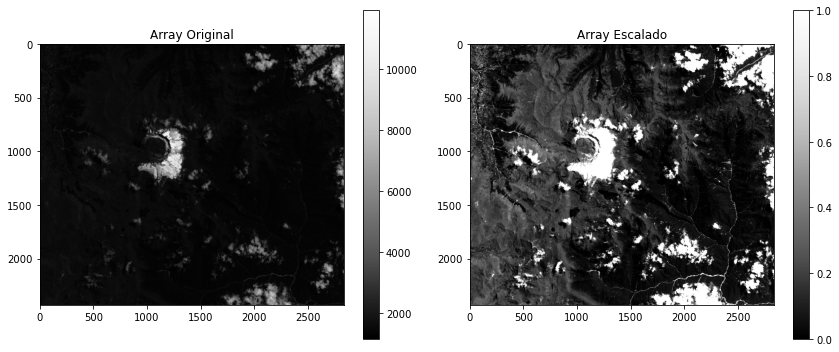

In [ ]:
# Escalar el array utilizando un percentil p=20
scaled_data = scale(banda_roja, p=6)

También es importante normalizar el array para poder visualizar sin invonvenientes.

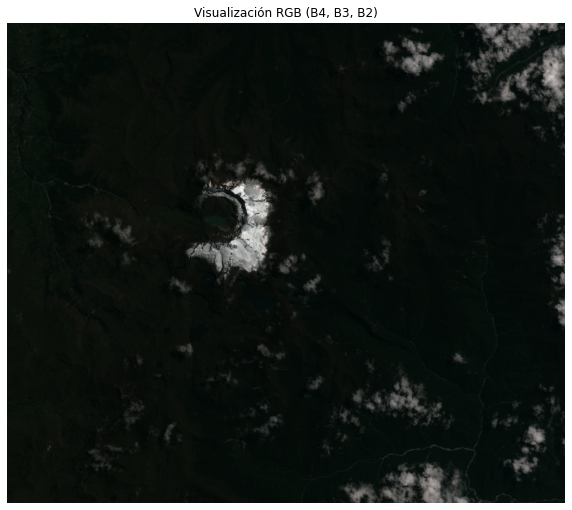

In [ ]:
# Normalizar los valores a rango [0, 1] para imshow (si es necesario)
def normalizar(banda):
    return (banda - banda.min()) / (banda.max() - banda.min())

banda_roja_norm = normalizar(banda_roja)
banda_verde_norm = normalizar(banda_verde)
banda_azul_norm = normalizar(banda_azul)

# Crear un arreglo RGB
rgb = np.dstack((banda_roja_norm, banda_verde_norm, banda_azul_norm))

# Visualizar la imagen en RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.title('Visualización RGB (B4, B3, B2)')
plt.axis('off')  # Ocultar los ejes
plt.show()

Se procede a escalar cada banda de la imagen y realizar una combinación RGB.

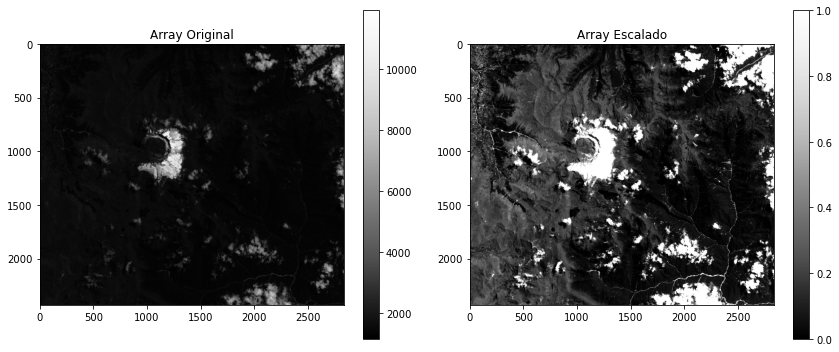

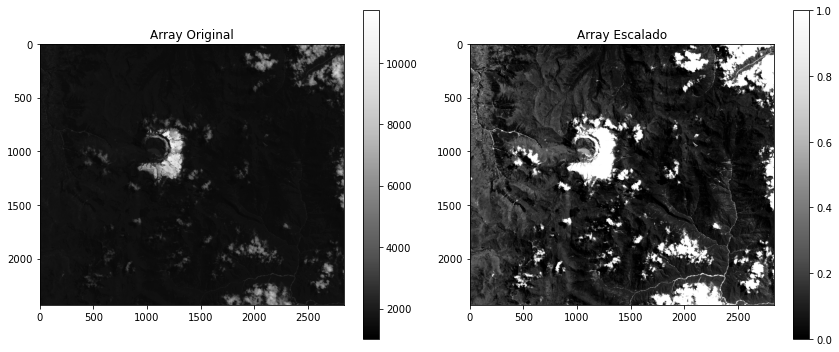

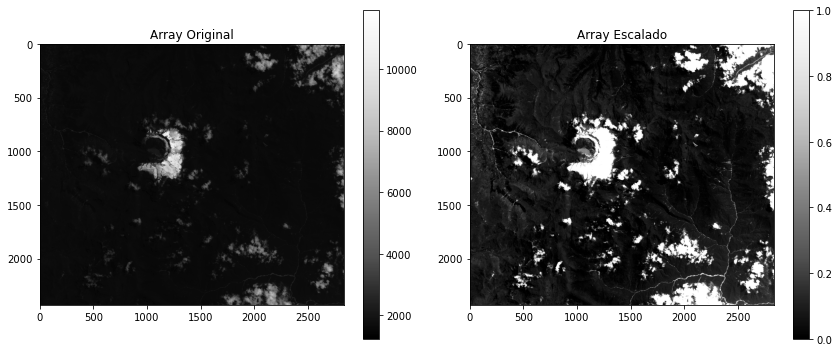

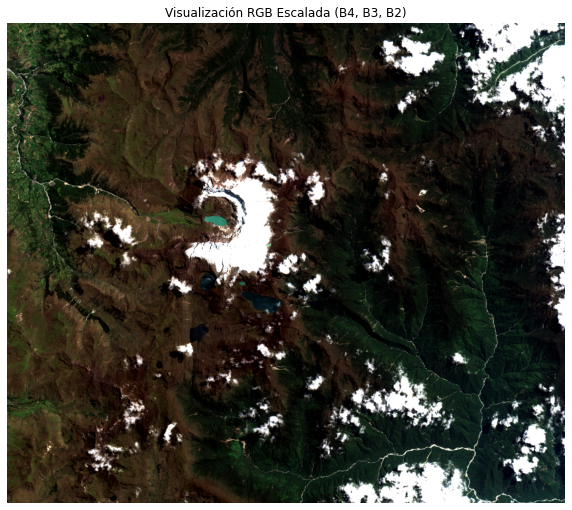

In [ ]:
# Escalar cada banda usando la función scale
banda_roja_scaled = scale(banda_roja, p=6)   # Aplicar escala con percentil 6-94
banda_verde_scaled = scale(banda_verde, p=6)
banda_azul_scaled = scale(banda_azul, p=6)

# Combinar las bandas escaladas en un solo arreglo RGB
rgb_scaled = np.dstack((banda_roja_scaled, banda_verde_scaled, banda_azul_scaled))

# Visualización de la imagen RGB escalada
plt.figure(figsize=(10, 10))
plt.imshow(rgb_scaled)
plt.title('Visualización RGB Escalada (B4, B3, B2)')
plt.axis('off')  # Ocultar los ejes
plt.show()

Con p = 6, se recortan los valores por debajo del percentil 6% (por ejemplo, valores menores a 600) y los valores por encima del percentil 94% (por ejemplo, mayores a 9,400).
Así, todo lo fuera de ese rango se mapea a 0 o 1 en el rango escalado, lo que mejora la claridad y el contraste visual de la imagen.

También se procede a obtener una visualización NIR,RED,GREEN .

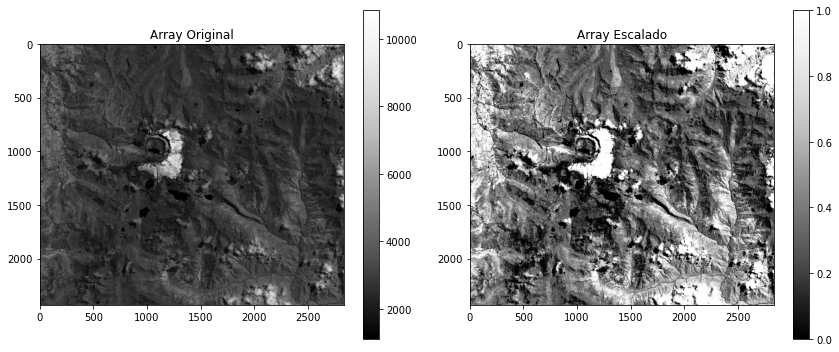

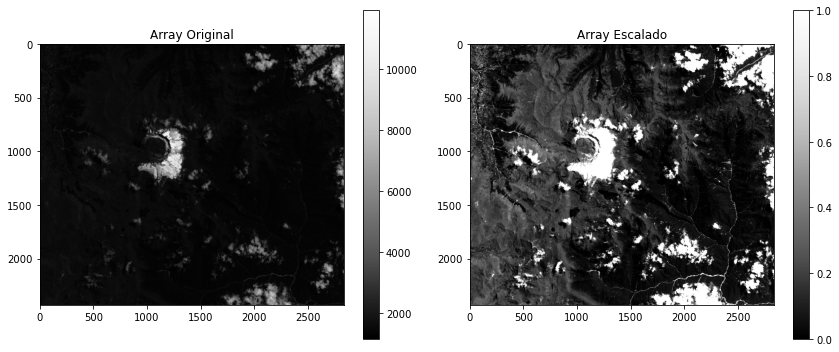

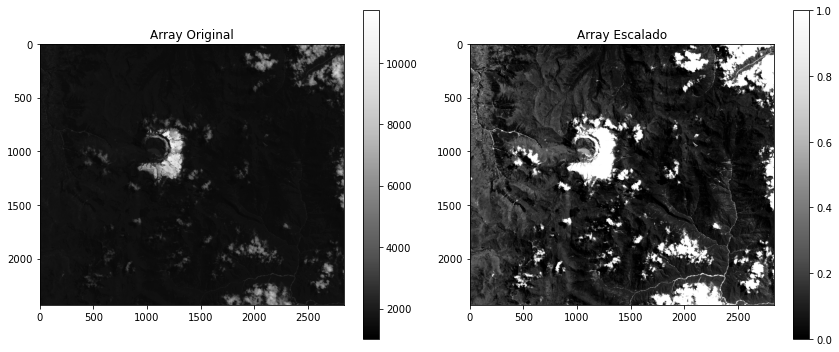

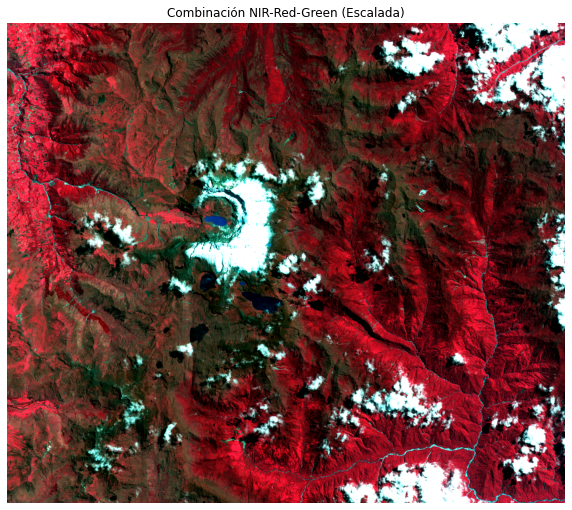

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Leer las bandas (NIR, Red, Green)
nir = ds.GetRasterBand(4).ReadAsArray()   # NIR (B8)
red = ds.GetRasterBand(1).ReadAsArray()   # Red (B4)
green = ds.GetRasterBand(2).ReadAsArray() # Green (B3)

# Aplicar la función scale() a cada banda
nir_scaled = scale(nir, p=6)
red_scaled = scale(red, p=6)
green_scaled = scale(green, p=6)

# Crear la imagen combinada NIR-Red-Green
nir_red_green = np.dstack((nir_scaled, red_scaled, green_scaled))

# Visualizar la imagen combinada
plt.figure(figsize=(10, 10))
plt.imshow(nir_red_green)
plt.title('Combinación NIR-Red-Green (Escalada)')
plt.axis('off')  # Opcional, para ocultar los ejes
plt.show()

Para mejorar el análisis de la imagen satelital se aplica el cálculo del NDVI.

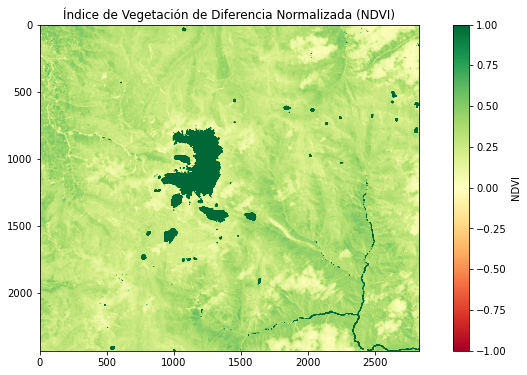

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Cálculo del NDVI usando las bandas NIR y Roja
ndvi = (banda_nir - banda_roja) / (banda_nir + banda_roja)

# Visualización del NDVI con escala ajustada
plt.figure(figsize=(12, 6))
plt.imshow(ndvi, vmin=-1, vmax=1, cmap='RdYlGn')  # Paleta "Rojo-Amarillo-Verde" para resaltar la vegetación
plt.colorbar(label='NDVI')
plt.title("Índice de Vegetación de Diferencia Normalizada (NDVI)")
plt.show()

Ahora se procede a leer el contenido de un archivo vectorial que posee muestras de cobertura de la escena de la imagen.

In [ ]:
# Lectura del vector
muestras = gpd.read_file('../data/raw_data/vector_altar/coberturas_muestras.shp')
muestras

,id,cobertura,geometry
0,None,Agua,"POLYGON ((786092.893 9814707.384, 786062.963 9..."
1,None,Glaciar,"POLYGON ((786202.200 9815918.873, 786118.918 9..."
2,None,Suelo,"POLYGON ((776026.210 9801008.836, 776166.748 9..."
3,None,Suelo,"POLYGON ((795790.012 9816449.794, 795930.550 9..."
4,None,Suelo,"POLYGON ((782990.647 9822154.595, 783058.313 9..."
5,None,Suelo,"POLYGON ((784297.130 9823369.988, 784453.283 9..."
6,None,Suelo,"POLYGON ((780382.887 9815728.886, 780414.118 9..."
7,None,Suelo,"POLYGON ((784362.193 9806187.920, 784502.731 9..."
8,None,Suelo,"POLYGON ((779740.056 9810763.212, 779698.415 9..."
9,None,Vegetacion,"POLYGON ((799207.167 9811377.414, 799644.396 9..."


Para variar la manipulación de los datos, ahora se utilizará la biblioteca rasterio.

In [ ]:
# Lectura del raster con rasterio
s2 = rasterio.open('../data/raw_data/Sentinel2_Altar.tif')

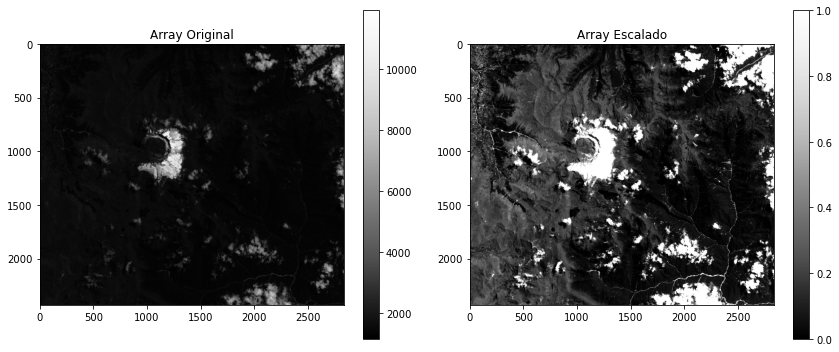

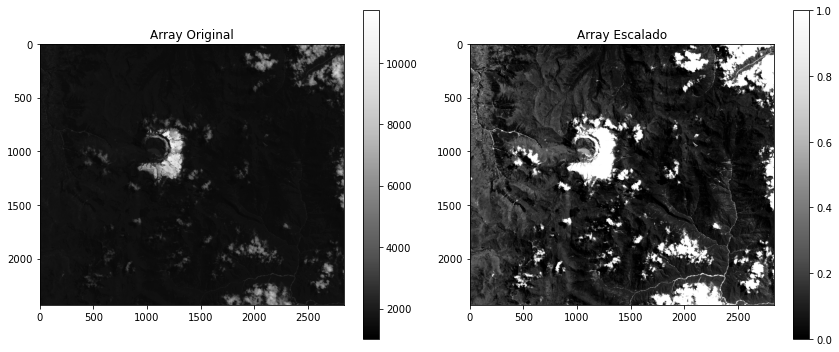

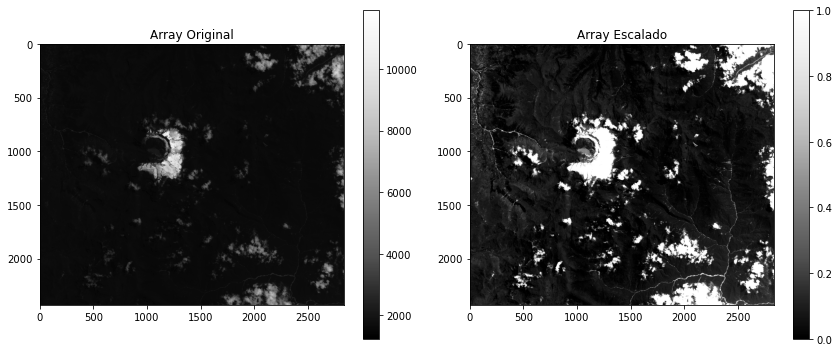

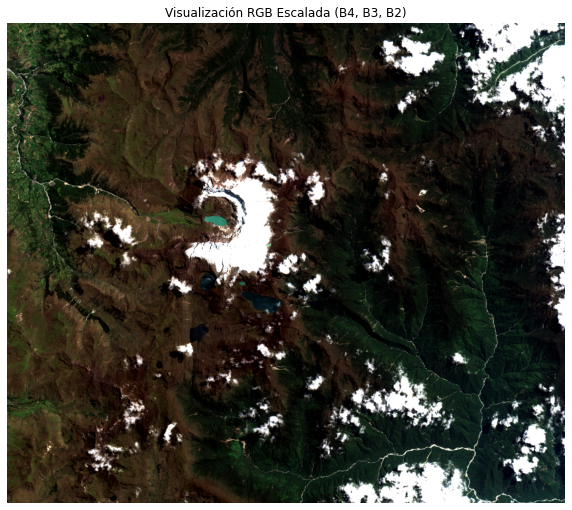

In [ ]:
# Obtener las bandas
banda_roja = s2.read(1)   # B4 (Rojo)
banda_verde = s2.read(2)  # B3 (Verde)
banda_azul = s2.read(3)   # B2 (Azul)
banda_nir = s2.read(4)    # B8 (NIR)

# Escalar las bandas
banda_roja_scaled = scale(banda_roja, p=6)
banda_verde_scaled = scale(banda_verde, p=6)
banda_azul_scaled = scale(banda_azul, p=6)

# Combinar las bandas escaladas en un solo arreglo RGB
rgb_scaled = np.dstack((banda_roja_scaled, banda_verde_scaled, banda_azul_scaled))

# Visualización de la imagen RGB escalada
plt.figure(figsize=(10, 10))
plt.imshow(rgb_scaled)
plt.title('Visualización RGB Escalada (B4, B3, B2)')
plt.axis('off')  # Ocultar los ejes
plt.show()

In [ ]:
print(s2.crs)
print(muestras.crs)

EPSG:32717
epsg:32717


In [ ]:
from rasterio.plot import plotting_extent
s2_plot_extent = plotting_extent(s2)

s2_plot_extent

(776010.0, 804340.0, 9800410.0, 9824760.0)

Se visualiza el archivo vectorial y raster a la par.

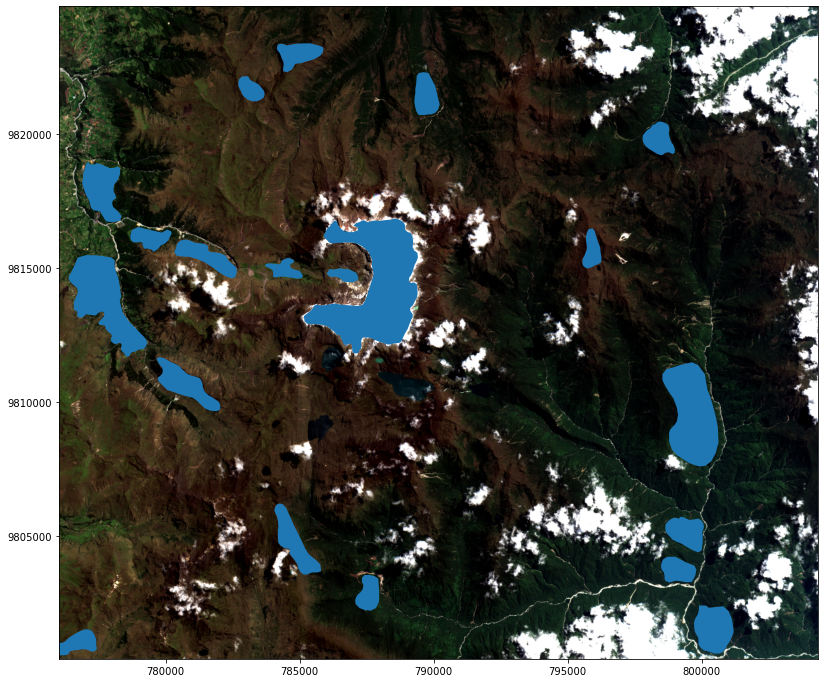

In [ ]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize = (24,12))
ax.imshow(rgb_scaled, extent = s2_plot_extent, cmap = 'gray')
muestras.plot(ax=ax)
# Evitar notación científica en los ejes
ax.ticklabel_format(style='plain', axis='y')
plt.show()

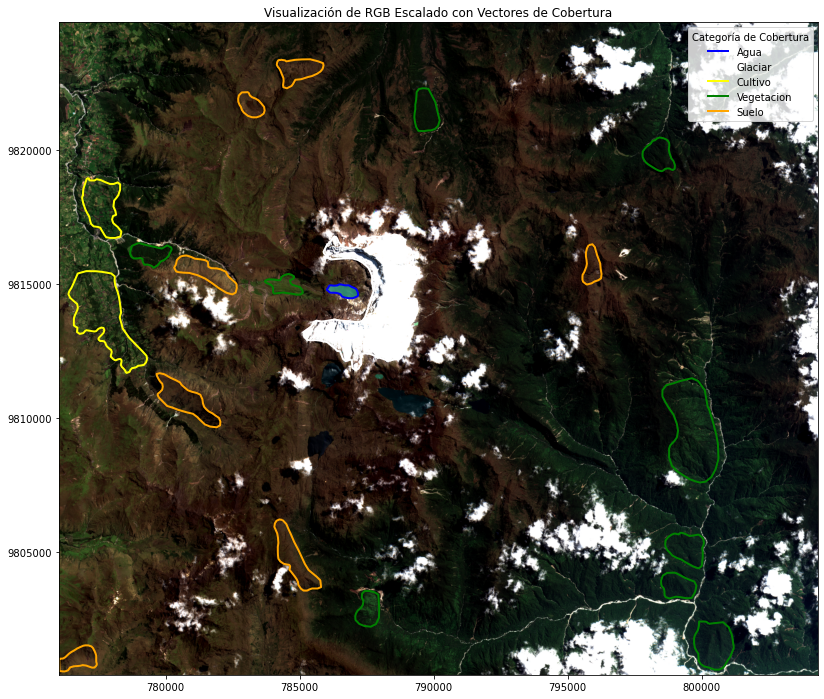

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D  # Importar Line2D para la leyenda

# Lectura del vector
muestras = gpd.read_file('../data/raw_data/vector_altar/coberturas_muestras.shp')

# Definir colores para cada categoría en "cobertura"
color_dict = {
    'Agua': 'blue',
    'Glaciar': 'white',
    'Cultivo': 'yellow',
    'Vegetacion': 'green',
    'Suelo': 'orange'
}

# Visualización
fig, ax = plt.subplots(figsize=(24, 12))
ax.imshow(rgb_scaled, extent=s2_plot_extent, cmap='gray')

# Superponer el vector con colores por categoría, solo el contorno (boundary)
for category, color in color_dict.items():
    muestras[muestras['cobertura'] == category].plot(ax=ax, edgecolor=color, facecolor='none', linewidth=2)

# Evitar notación científica en los ejes
ax.ticklabel_format(style='plain', axis='y')

# Crear objetos de línea para la leyenda
legend_elements = [Line2D([0], [0], color=color, lw=2, label=category) for category, color in color_dict.items()]

# Agregar la leyenda
ax.legend(handles=legend_elements, title='Categoría de Cobertura', loc='upper right')
plt.title('Visualización de RGB Escalado con Vectores de Cobertura')
plt.show()

Ahora se obtienen estadísticas zonales al elegir únicamente la cobertura de glaciar.

In [ ]:
# Leer las bandas individuales
s2_bandas = s2.read()

In [ ]:
from rasterstats import zonal_stats

# Filtrar el shapefile para obtener solo la categoría "glaciar"
glaciares = muestras[muestras['cobertura'] == 'Glaciar']

In [ ]:
from rasterstats import zonal_stats

zs_glaciar_b1 = zonal_stats(glaciares, s2_bandas[0,:,:], affine=s2.transform, stats=['min', 'max', 'mean', 'median', 'majority', 'count'])
zs_glaciar_b1

C:\Users\ronny\anaconda3\envs\Curso_PDIS\lib\site-packages\rasterstats\io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


[{'min': 1245.0,
  'max': 11941.0,
  'mean': 6266.683533304986,
  'count': 108182,
  'median': 6458.0,
  'majority': 1518.0}]

In [ ]:
zs_list = []

for i,banda in enumerate(s2_bandas):
    zs = zonal_stats(glaciares, banda, affine=s2.transform, stats=['min', 'max', 'mean', 'median', 'majority','std', 'count'])
    #Nos quedamos con el unico elemento que tiene zs:
    zs = zs[0]
    #Agregamos una clave al diccionario indicando qué banda es
    zs['band'] = i+1
    zs_list.append(zs)

zs_list

C:\Users\ronny\anaconda3\envs\Curso_PDIS\lib\site-packages\rasterstats\io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
C:\Users\ronny\anaconda3\envs\Curso_PDIS\lib\site-packages\rasterstats\io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
C:\Users\ronny\anaconda3\envs\Curso_PDIS\lib\site-packages\rasterstats\io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")
C:\Users\ronny\anaconda3\envs\Curso_PDIS\lib\site-packages\rasterstats\io.py:313: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


[{'min': 1245.0,
  'max': 11941.0,
  'mean': 6266.683533304986,
  'count': 108182,
  'std': 2535.5397628214882,
  'median': 6458.0,
  'majority': 1518.0,
  'band': 1},
 {'min': 1017.0,
  'max': 11704.0,
  'mean': 6143.144506479821,
  'count': 108182,
  'std': 2460.5640342191577,
  'median': 6331.0,
  'majority': 7161.0,
  'band': 2},
 {'min': 1506.0,
  'max': 11896.0,
  'mean': 6257.3436708509735,
  'count': 108182,
  'std': 2461.5744422691364,
  'median': 6464.0,
  'majority': 7592.0,
  'band': 3},
 {'min': 1238.0,
  'max': 10282.0,
  'mean': 5551.083553641086,
  'count': 108182,
  'std': 2088.170610333954,
  'median': 5723.0,
  'majority': 6917.0,
  'band': 4}]

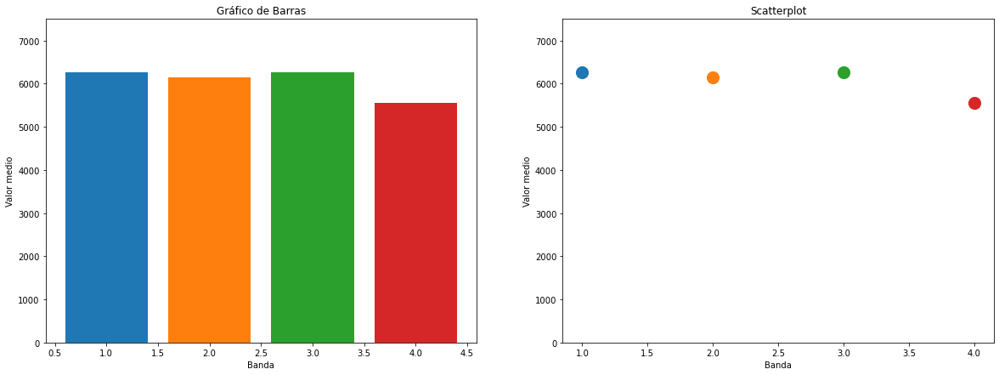

In [ ]:
plt.figure(figsize = (20,7))
for zs in zs_list:

    x = zs['band']
    y = zs['mean']
    plt.subplot(1,2,1)
    plt.bar(x=x, height = y)
    plt.xlabel('Banda')
    plt.ylabel('Valor medio')
    plt.title('Gráfico de Barras')
    plt.ylim(0,7500)

    plt.subplot(1,2,2)
    plt.scatter(x,y, s = 200)
    plt.xlabel('Banda')
    plt.ylabel('Valor medio')
    plt.title('Scatterplot')
    plt.ylim(0,7500)

plt.show()

In [ ]:
s2_mask_glaciar = mask(dataset=s2,shapes = glaciares.geometry, crop = True, filled = False)[0]

In [ ]:
s2_mask_glaciar.shape

(4, 505, 427)

In [ ]:
%matplotlib inline

In [ ]:
s2_mask_glaciar

masked_array(
  data=[[[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
    

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def scale(array, p=0, band_name="Banda"):
    '''
    Escala un array 2D a valores entre 0 y 1, tomando como mínimo el percentil p
    y como máximo el percentil 100-p. Visualiza el array original y el escalado con el nombre de la banda.

    Parameters:
    array (ndarray): Array 2D a escalar.
    p (float): Percentil para determinar los límites de escalado. Por defecto es 0.
    band_name (str): Nombre de la banda para mostrar en los títulos de los gráficos.

    Returns:
    ndarray: Array escalado entre 0 y 1.
    '''

    # Asegurar que el array no sea de solo lectura
    array = np.array(array, copy=True)

    # Extraer los valores válidos del array (excluyendo NaN)
    valid_values = array[~np.isnan(array)]

    # Calcular vmin y vmax basados en los percentiles
    vmin = np.percentile(valid_values, p)
    vmax = np.percentile(valid_values, 100 - p)

    # Escalar los valores entre 0 y 1
    scaled = np.clip((array - vmin) / (vmax - vmin), 0, 1)

    # Visualización del array original y escalado con títulos personalizados
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax[0].imshow(array, cmap='Greys_r', vmin=np.nanmin(array), vmax=np.nanmax(array))
    ax[0].set_title(f'{band_name}: Array Original')
    plt.colorbar(ax[0].imshow(array, cmap='Greys_r'), ax=ax[0])

    ax[1].imshow(scaled, cmap='Greys_r', vmin=0, vmax=1)
    ax[1].set_title(f'{band_name}: Array Escalado')
    plt.colorbar(ax[1].imshow(scaled, cmap='Greys_r'), ax=ax[1])

    plt.tight_layout()
    plt.show()

    return scaled

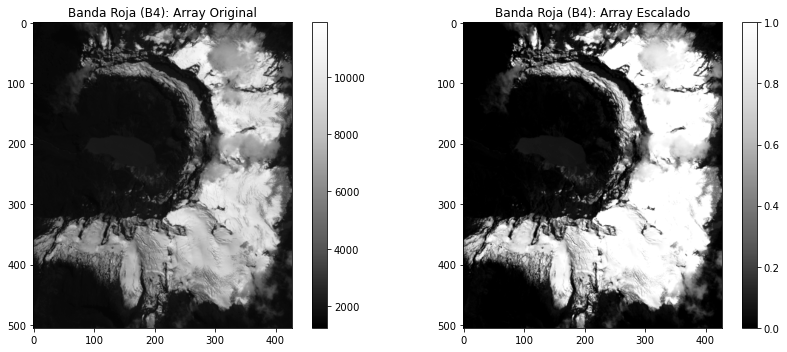

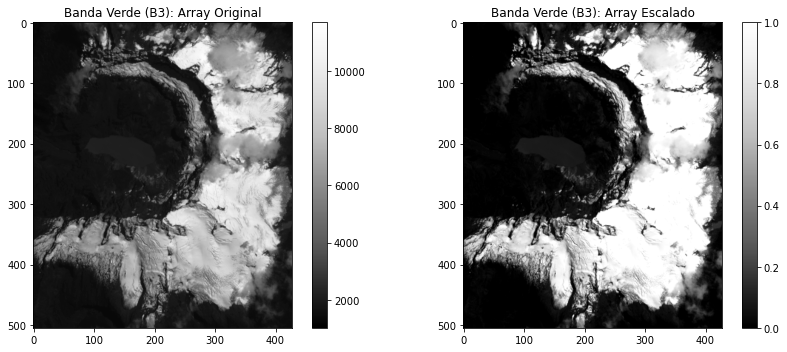

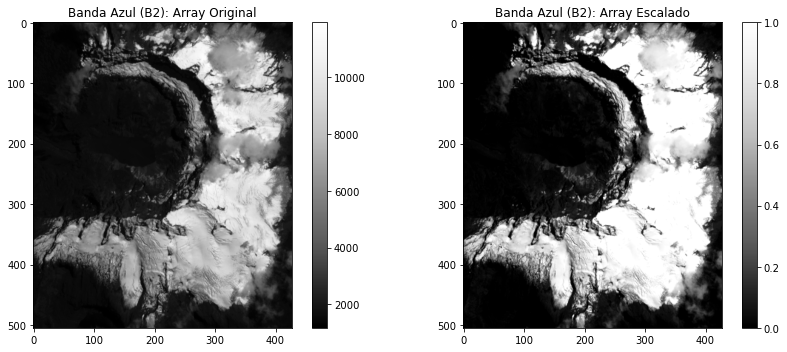

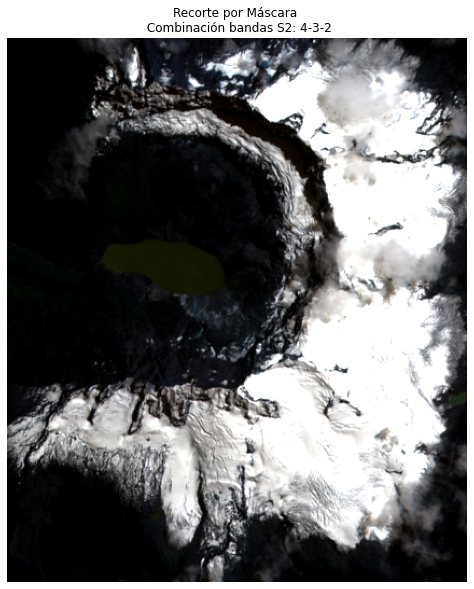

In [ ]:
# Copiar las bandas y escalarlas con títulos personalizados
banda_roja = s2_mask_glaciar[2, :, :].copy()  # Banda 4 (Rojo)
banda_verde = s2_mask_glaciar[1, :, :].copy()  # Banda 3 (Verde)
banda_azul = s2_mask_glaciar[0, :, :].copy()  # Banda 2 (Azul)

banda_roja_scaled = scale(banda_roja, p=15, band_name="Banda Roja (B4)")
banda_verde_scaled = scale(banda_verde, p=15, band_name="Banda Verde (B3)")
banda_azul_scaled = scale(banda_azul, p=15, band_name="Banda Azul (B2)")

# Combinar en un solo array RGB
rgb_mask = np.dstack((banda_roja_scaled, banda_verde_scaled, banda_azul_scaled))

# Mostrar la imagen RGB
plt.figure(figsize=(10, 10))
plt.imshow(rgb_mask)
plt.title("Recorte por Máscara \n Combinación bandas S2: 4-3-2")
plt.axis('off')  # Ocultar los ejes
plt.show()

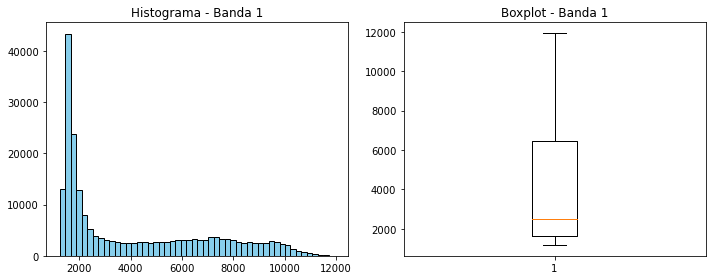

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar la banda 1 del array
s2_mask_glaciar_b1 = s2_mask_glaciar[0, :, :]

plt.figure(figsize=(10, 4))

# Histograma con Matplotlib
plt.subplot(1, 2, 1)
plt.hist(s2_mask_glaciar_b1.ravel(), bins=50, color='skyblue', edgecolor='black')
plt.title("Histograma - Banda 1")

# Boxplot con Matplotlib
plt.subplot(1, 2, 2)
plt.boxplot(s2_mask_glaciar_b1.ravel(), vert=True)
plt.title("Boxplot - Banda 1")

plt.tight_layout()
plt.show()

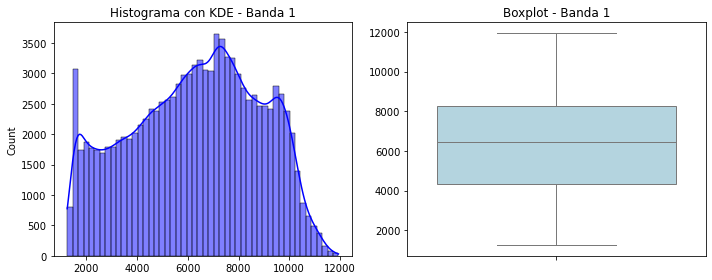

In [ ]:
plt.figure(figsize=(10, 4))

# Histograma con Seaborn
plt.subplot(1, 2, 1)
sns.histplot(s2_mask_glaciar_b1.ravel(), bins=50, kde=True, color='blue')
plt.title("Histograma con KDE - Banda 1")

# Boxplot con Seaborn
plt.subplot(1, 2, 2)
sns.boxplot(y=s2_mask_glaciar_b1.ravel(), color='lightblue')
plt.title("Boxplot - Banda 1")

plt.tight_layout()
plt.show()

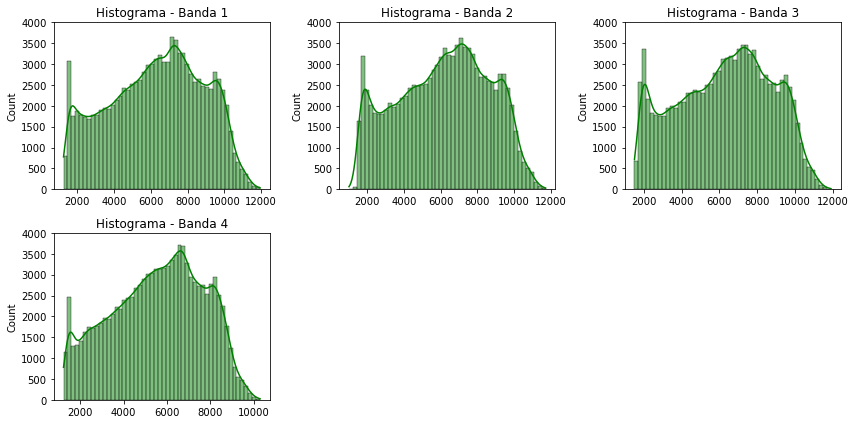

In [ ]:
plt.figure(figsize=(12, 6))

# Iterar sobre cada banda del array y crear un histograma para cada una
for i, banda in enumerate(s2_mask_glaciar):
    plt.subplot(2, 3, i + 1)
    sns.histplot(banda.ravel(), bins=50, kde=True, color='green')
    plt.title(f'Histograma - Banda {i + 1}')
    plt.ylim(0, 4000)  # Ajuste de límites para homogeneizar la escala

plt.tight_layout()
plt.show()

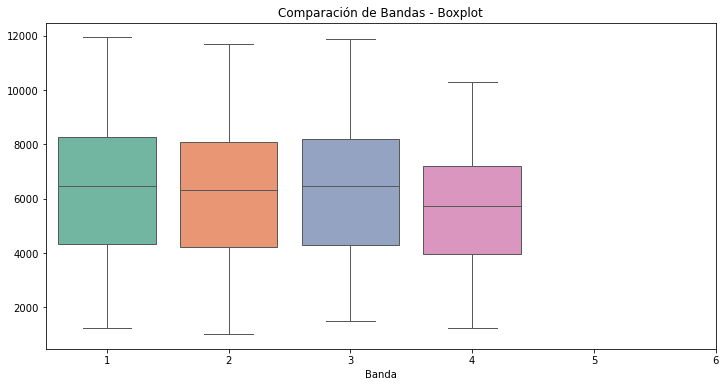

In [ ]:
# Convertir cada banda en un array unidimensional y agregarlos a una lista
l = [banda.ravel() for banda in s2_mask_glaciar]

plt.figure(figsize=(12, 6))

# Boxplot con todas las bandas
sns.boxplot(data=l, palette='Set2')
plt.xlabel('Banda')
plt.xticks(ticks=[0, 1, 2, 3, 4, 5], labels=['1', '2', '3', '4', '5', '6'])
plt.title("Comparación de Bandas - Boxplot")

plt.show()